In [53]:
%run ../_preamble.ipynb
from _work.src.data import small_dataloader as dataloader
from _work.src.models import AutoEncoder
from _work.src.modules.eval import eval_model
from _work.src.modules.train import train_model
from _work.src.modules.replay import get_attractors
from _work.src.modules.plot import (
    plot_metrics,
    plot_parameters,
    plot_tensor,
    plot_grid,
    plot_SVD,
)
from _work.src.modules.utils import get_closest_item
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import torch

## Misc

In [64]:
from torch.utils.data import Dataset, DataLoader
from _work.src.modules.replay import iterate

def generate_patterns(model):
    second_epochs = 10000
    states_per_run = 5

    states, activations = iterate(model, runs=second_epochs//states_per_run, steps=20)
    states = torch.vstack(tuple(states[:, -states_per_run]))

    class ReplayDataset(Dataset):
        def __init__(self, data):
            super().__init__()
            self.data = data
        
        def __len__(self):
            return len(self.data)
        
        def __getitem__(self, i):
            return {
                'y': self.data[i],
            }

    dataloaders = []
    for _ in range(second_epochs):
        indices = np.random.choice(list(range(len(states))), size=8, replace=False)
        data = ReplayDataset(states[indices])
        dl = DataLoader(data, shuffle=True, batch_size=4)
        dataloaders.append(dl)
    
    return dataloaders

## Example

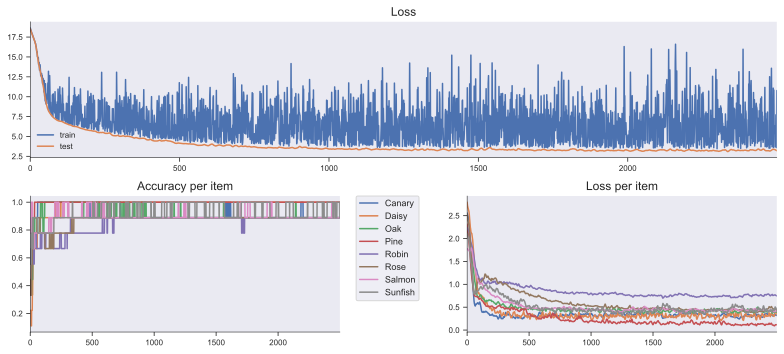

In [26]:
metrics = train_model(
    model := AutoEncoder(
        sizes=[dataloader.dataset.NUM_ATTRIBUTES, 2],
        batch_norm=False,
        dropout=0.15,
    ),
    optimizer := torch.optim.AdamW(model.parameters(), lr=1e-2),
    loss_fn := torch.nn.MSELoss(reduction="sum"),
    dataloader,
    epochs=2500,
    noise_mean=0,
    noise_stdev=1,
    l1_lambda=0.005,
)

plot_metrics(metrics);

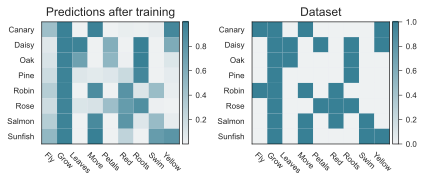

In [27]:
eval_model(model, dataloader);

In [28]:
plot_grid(model, dataloader);

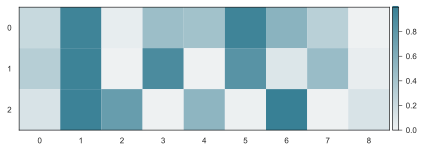

In [34]:
(attractor_states, _), (attractor_activs, _) = get_attractors(
    model,
    runs=500,
    steps=50,
    burn_in_time=25,
    states_or_activations="states",
    min_occurrence=5,
    round=True,
)
plot_tensor(attractor_states);

In [36]:
attractor_activs

tensor([[0.0000, 0.0000],
        [0.0000, 4.1333],
        [1.8211, 0.0000]])

## Parameterization

### Over 1

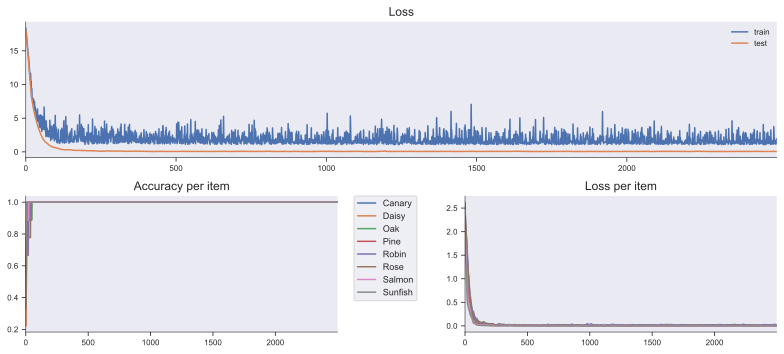

In [73]:
metrics_over1 = train_model(
    model_over1 := AutoEncoder(
        sizes=[dataloader.dataset.NUM_ATTRIBUTES, 10],
        batch_norm=False,
        dropout=0.15,
    ),
    optimizer_over1 := torch.optim.AdamW(model_over1.parameters(), lr=1e-2),
    loss_fn_over1 := torch.nn.MSELoss(reduction="sum"),
    dataloader,
    epochs=2500,
    noise_mean=0,
    noise_stdev=1,
    l1_lambda=0.005,
)

plot_metrics(metrics_over1);

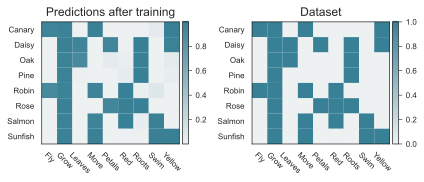

In [74]:
eval_model(model_over1, dataloader);

In [75]:
plot_grid(model_over1, dataloader);

[0.48775254 0.31575865]


[6154 4208  858  572  494  312  151  113   52   10    6    6]


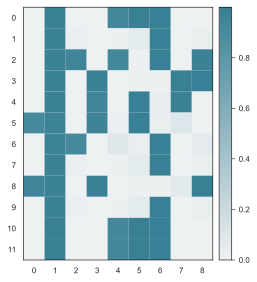

In [76]:
(attractor_states_over1, state_counts_over1), (attractor_activs_over1, _) = get_attractors(
    model_over1,
    runs=500,
    steps=50,
    burn_in_time=25,
    min_occurrence=5,
    round=True,
)
plot_tensor(attractor_states_over1);
print(state_counts_over1)

### Over 2

In [89]:
dl = generate_patterns(model_over1)

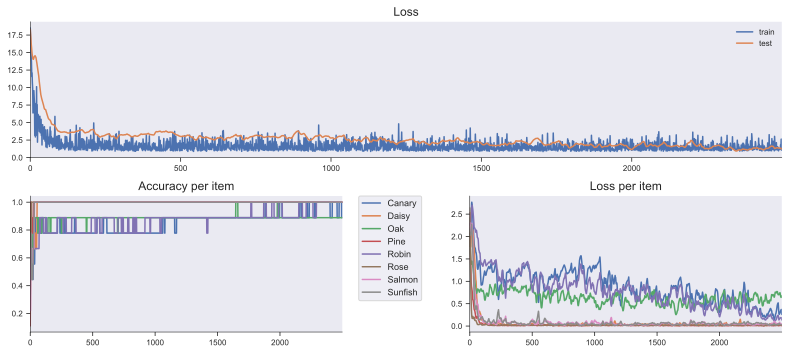

In [90]:
metrics_over2 = train_model(
    model_over2 := AutoEncoder(
        sizes=[dataloader.dataset.NUM_ATTRIBUTES, 10],
        batch_norm=False,
        dropout=0.15,
    ),
    optimizer_over2 := torch.optim.AdamW(model_over2.parameters(), lr=1e-2),
    loss_fn_over2 := torch.nn.MSELoss(reduction="sum"),
    dl,
    test_loader=dataloader,
    epochs=2500,
    noise_mean=0,
    noise_stdev=1,
    l1_lambda=0.005,
)

plot_metrics(metrics_over2);

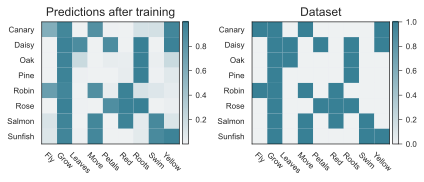

In [91]:
eval_model(model_over2, dataloader);

In [92]:
plot_grid(model_over2, dataloader);

[0.55411693 0.24575835]


### Under 2

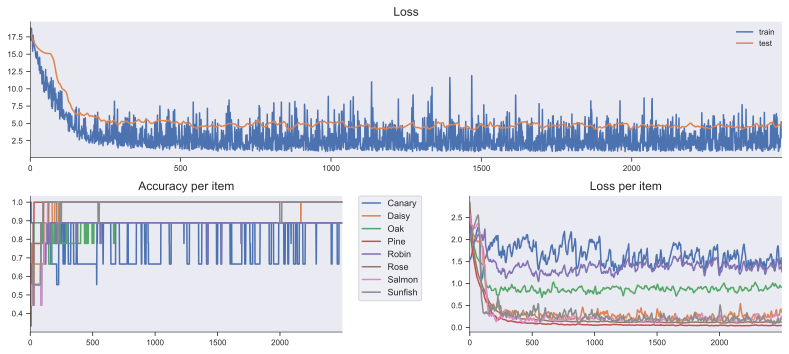

In [93]:
metrics_under2 = train_model(
    model_under2 := AutoEncoder(
        sizes=[dataloader.dataset.NUM_ATTRIBUTES, 2],
        batch_norm=False,
        dropout=0.15,
    ),
    optimizer_under2 := torch.optim.AdamW(model_under2.parameters(), lr=1e-2),
    loss_fn_under2 := torch.nn.MSELoss(reduction="sum"),
    dl,
    test_loader=dataloader,
    epochs=2500,
    noise_mean=0,
    noise_stdev=1,
    l1_lambda=0.005,
)

plot_metrics(metrics_under2);

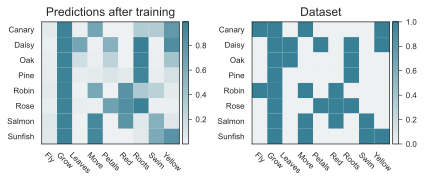

In [94]:
eval_model(model_under2, dataloader);

In [95]:
plot_grid(model_under2, dataloader);